<a href="https://colab.research.google.com/github/hardikcode-creator/ML/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
! unzip "/content/drive/MyDrive/ML_Projects/dog-vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/ML_Projects/dog-vision"

unzip:  cannot find or open /content/drive/MyDrive/ML_Projects/dog-vision/dog-breed-identification.zip, /content/drive/MyDrive/ML_Projects/dog-vision/dog-breed-identification.zip.zip or /content/drive/MyDrive/ML_Projects/dog-vision/dog-breed-identification.zip.ZIP.


In [ ]:
!unzip "/content/drive/MyDrive/ML_Projects/dog-vision/dog-breed-identification (1).zip" -d "drive/MyDrive/ML_Projects/dog-vision/"

unzip:  cannot find or open /content/drive/MyDrive/ML_Projects/dog-vision/dog-breed-identification (1).zip, /content/drive/MyDrive/ML_Projects/dog-vision/dog-breed-identification (1).zip.zip or /content/drive/MyDrive/ML_Projects/dog-vision/dog-breed-identification (1).zip.ZIP.


## Using tf for Dog-Vision project using tranfser learning

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub

In [ ]:
## check for GPU access
print("Gpu avaliable for use" if tf.config.list_physical_devices("GPU") else "Not Available")

## if not available go to runtime and change runtime to GPU

Gpu avaliable for use


## Getting out data ready
 With all machine learning models all oue data should be in numerical format



In [ ]:
import pandas as pd

label_df=pd.read_csv("/content/drive/MyDrive/ML_Projects/dog-vision/labels.csv")

In [ ]:
label_df.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

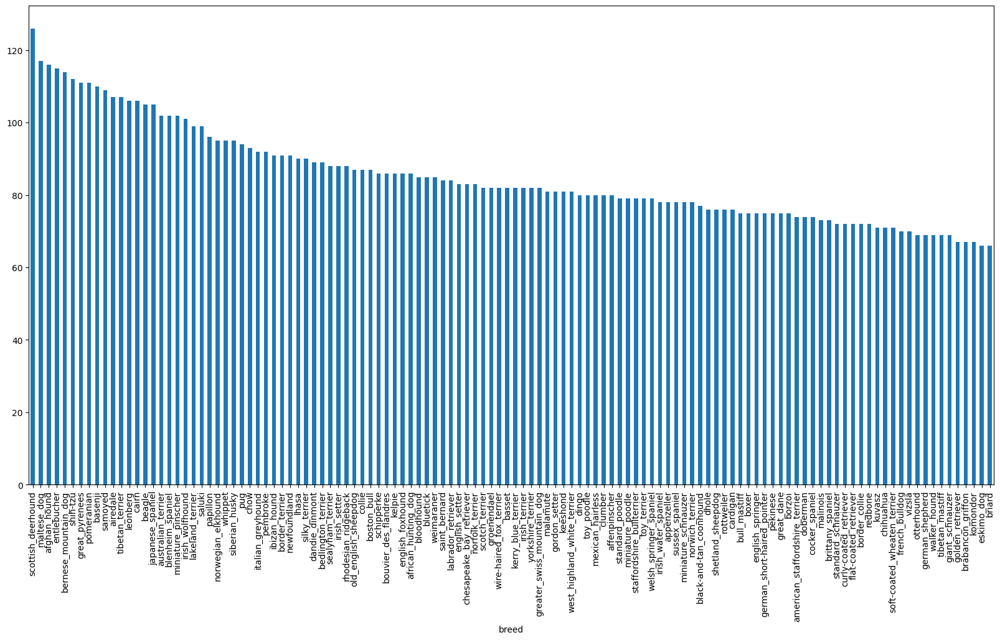

In [ ]:
label_df["breed"].value_counts().plot(kind='bar', figsize=(20,10))

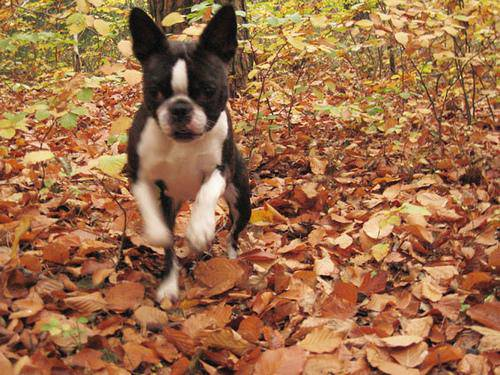

In [ ]:
#Let's view a image
from IPython.display import Image
Image("/content/drive/MyDrive/ML_Projects/dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

In [ ]:
# Creating pathnames for images
filenames=['drive/MyDrive/ML_Projects/dog-vision/train/'+fname +'.jpg'for fname in label_df['id']]
filenames=filenames[:4785]



In [ ]:
# Check whether filenames images number of actual images  in train folder
import os
if len(os.listdir("drive/MyDrive/ML_Projects/dog-vision/train/"))==len(filenames):
  print("filenames equal same as train length", len(os.listdir('drive/MyDrive/ML_Projects/dog-vision/train/')))
else:
  print("Not matched", len(os.listdir('drive/MyDrive/ML_Projects/dog-vision/train/')), len(filenames))

filenames equal same as train length 4785


In [ ]:
import numpy as np
labels=label_df['breed'][:4785]

In [ ]:
#Turning every label in labels list to boolean array
print(labels[0])
unique_labels=np.unique(labels)
label_bool=[label==unique_labels for label in labels]
label_bool[:2]

boston_bull


[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
print(label_bool[0].argmax())
print(label_bool[0].astype(int))

19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
X=filenames
Y=label_bool
len(X)

4785

In [ ]:
# setting number of iamges for experimenting
NUM_IMAGES=2500 #@param {type :"slider", min:1000,max:4500,step:100}

In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_val,Y_train,Y_val=train_test_split(X[:NUM_IMAGES], Y[:NUM_IMAGES],test_size=0.2,random_state=42)



# turning images to tensor
Preprocessing:
* 1.Taken an imput as filepath for image
* 2.Use Tensorflow to read the file path and store image in `image` variable
* 3.Turn our image to Tensors
* 4.Normalized the image
* 5.Resize the image to (224,224)
* 6.Return the modified shape

In [ ]:
# Convert image to numpy
from matplotlib.pyplot import imread
image=imread(filenames[2])

#convert to tensors
tf.constant(image)[:2]


<tf.Tensor: shape=(2, 500, 3), dtype=uint8, numpy=
array([[[ 97,  96,  91],
        [102, 101,  96],
        [108, 107, 102],
        ...,
        [ 10,  12,  11],
        [ 10,  12,  11],
        [ 10,  12,  11]],

       [[ 99,  98,  93],
        [102, 101,  96],
        [108, 107, 102],
        ...,
        [ 18,  20,  19],
        [ 18,  20,  19],
        [ 18,  20,  19]]], dtype=uint8)>

In [ ]:

#Define image size
IMG_SIZE=224
def preprocessing(image_path):
  """
   Takes an image path and return Tensor
  """
  #read in an images path
  image=tf.io.read_file(image_path)
  # converting the image into tensors
  image=tf.image.decode_jpeg(image,channels=3)
  # Normalize the value fo tensor fomr 0-255 to 0-1
  image=tf.image.convert_image_dtype(image,dtype=tf.float16)
  #Resize the image
  image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])
  return image


# Converting data in batches


In [ ]:
def get_image_label_tuple(image_path,label):
  """
    Return a tuple of image , label
  """
  image=preprocessing(image_path)
  return image,label

Now we want to convert the data inform of batches of 32

In [ ]:
BATCH_SIZE=32
# creating batches
# Y could be None as test_data wont have labels
# we will shuffle if it is train_data but not when validation or test_data
def create_data_batches(X,Y=None,test_data=False,validation_data=False):
  """
  Creates a image,label  batch
  """
  if test_data:
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch=data.map(preprocessing).batch(BATCH_SIZE)
    return data_batch
  elif validation_data:
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(Y)))
    data_batch=data.map(get_image_label_tuple).batch(BATCH_SIZE)
    return data_batch
  else:
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(Y)))
    data=data.shuffle(buffer_size=len(X))
    data_batch=data.map(get_image_label_tuple).batch(BATCH_SIZE)
    return data_batch

In [ ]:
train_data=create_data_batches(X_train,Y_train)
validation_data=create_data_batches(X_val,Y_val,False,True)


In [ ]:
import matplotlib.pyplot as plt
def show_images(images,labels):
  plt.figure(figsize=(10,10))

  for i in range(25):
    plt.subplot(5, 5, i+1)
    plt.imshow(images[i])
    plt.title(unique_labels[labels[i].argmax()])
    plt.axis("off")

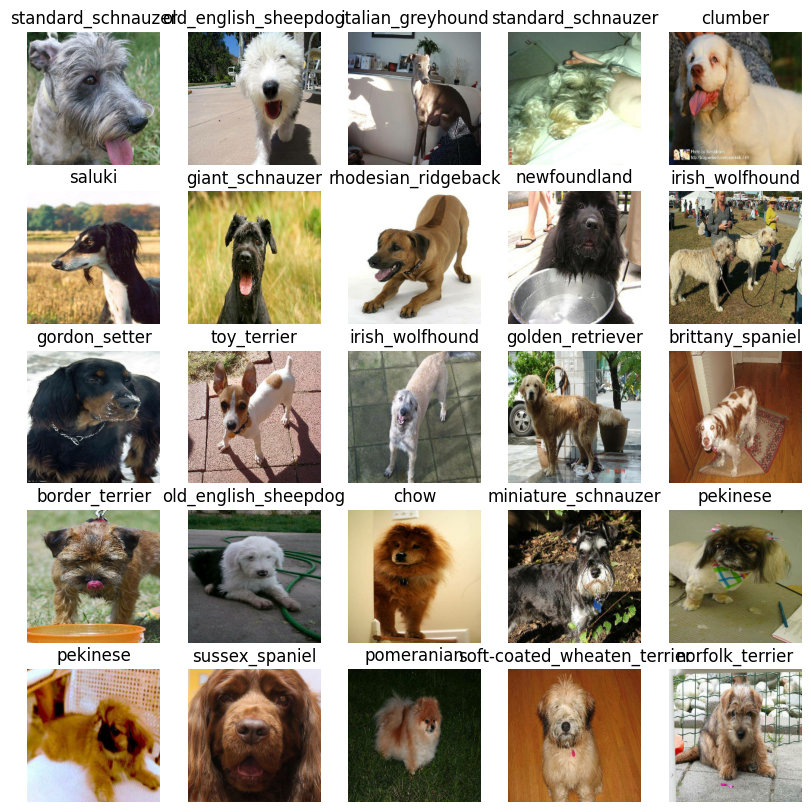

In [ ]:
train_images,train_labels=next(train_data.as_numpy_iterator())
show_images(train_images,train_labels)

**subplot**
Single Graph Context: plt.subplot is used to add individual subplots to the same figure. Each call specifies a position in a grid, allowing you to plot multiple graphs within the same figure.
Example: You could add different plots one by one in various positions of the same figure.
**subplots**
Multiple Axes at Once: plt.subplots creates a grid of subplots (axes) in a single call, returning both the figure and an array of axes. This is useful for managing multiple plots more easily, as they are all set up in one step.
Example: You can create a full 2x2 grid of subplots all at once and then populate each subplot with different plots.

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.models import Model

# Set parameters
INPUT_SHAPE = (224, 224, 3)  # Input shape for a single image
OUTPUT_SHAPE = 120  # Number of output classes
BATCH_SIZE = 32  # Batch size for training

def create_model(INPUT_SHAPE=INPUT_SHAPE, OUTPUT_SHAPE=OUTPUT_SHAPE):
    print("Building model with MobileNetV2 from Keras Applications")

    # Load the pre-trained MobileNetV2 model without the top classification layer
    base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=INPUT_SHAPE)

    # Freeze the base model layers
    base_model.trainable = False

    # Create the model
    inputs = base_model.input
    x = base_model.output
    x = GlobalAveragePooling2D()(x)  # Add global spatial average pooling layer
    x = Dropout(rate=0.2)(x)  # Add dropout for regularization
    outputs = Dense(OUTPUT_SHAPE, activation='softmax')(x)  # Output layer

    model = Model(inputs, outputs)

    # Compile the model
    model.compile(
        loss='categorical_crossentropy',
        optimizer=tf.keras.optimizers.Adam(),
        metrics=['accuracy']
    )

    return model

# Create the model
model = create_model()
model.summary()  # Display the model architecture


Building model with MobileNetV2 from Keras Applications
9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1 (Conv2D)            │ (None, 112, 112, 32)   │            864 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bn_Conv1                  │ (None, 112, 112, 32)   │            128 │ Conv1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1_relu (ReLU)         │ (None, 112, 112, 32)   │              0 │ bn_Conv1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise   │ (None, 112, 112, 32)   │            288 │ Conv1_relu[0][0]       │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 112, 112, 32)   │            128 │ expanded_conv_depthwi… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 112, 112, 32)   │              0 │ expanded_conv_depthwi… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project     │ (None, 112, 112, 16)   │            512 │ expanded_conv_depthwi… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project_BN  │ (None, 112, 112, 16)   │             64 │ expanded_conv_project… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand (Conv2D)   │ (None, 112, 112, 96)   │          1,536 │ expanded_conv_project… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_BN         │ (None, 112, 112, 96)   │            384 │ block_1_expand[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_relu       │ (None, 112, 112, 96)   │              0 │ block_1_expand_BN[0][… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_pad               │ (None, 113, 113, 96)   │              0 │ block_1_expand_relu[0… │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_depthwise         │ (None, 56, 56, 96)     │            864 │ block_1_pad[0][0]      │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_depthwise_BN 

 Total params: 2,411,704 (9.20 MB)

 Trainable params: 153,720 (600.47 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

## Creating callbacks

callbacks help track progress of our models during training and save its progress, stop training early if model overfits

* 1.TensorBoard : for managing progress
* 2.Another one for checking overfit

In [ ]:
# To track Progress
%load_ext tensorboard

import datetime
def create_tensorboard_callback():
  log_dir=os.path.join("drive/MyDrive/ML_Projects/dog-vision/logs",
                       datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  tensorboard_callback=tf.keras.callbacks.TensorBoard(log_dir=log_dir)
  return tensorboard_callback

## Early stopping Callback
it prevents from overfit by stopping training if a certian evaluation metric stops improving

In [ ]:
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                               patience=3)

# patience=no of epochs after which non improvement in monitor metric it stops training the model

##Training models

In [ ]:
def train_model():
  model=create_model()
  tensorboard=create_tensorboard_callback()
  model.fit(x=train_data,epochs=100,validation_data=validation_data, validation_freq=1, callbacks=[tensorboard,early_stopping])
  return model
model=train_model()

Building model with MobileNetV2 from Keras Applications
Epoch 1/100
63/63 ━━━━━━━━━━━━━━━━━━━━ 169s 2s/step - accuracy: 0.1184 - loss: 4.3940 - val_accuracy: 0.5280 - val_loss: 2.0225
Epoch 2/100
63/63 ━━━━━━━━━━━━━━━━━━━━ 21s 334ms/step - accuracy: 0.7494 - loss: 1.3008 - val_accuracy: 0.6380 - val_loss: 1.3775
Epoch 3/100
63/63 ━━━━━━━━━━━━━━━━━━━━ 20s 316ms/step - accuracy: 0.8903 - loss: 0.6541 - val_accuracy: 0.6780 - val_loss: 1.1612
Epoch 4/100
63/63 ━━━━━━━━━━━━━━━━━━━━ 18s 285ms/step - accuracy: 0.9496 - loss: 0.3999 - val_accuracy: 0.6880 - val_loss: 1.0789
Epoch 5/100
63/63 ━━━━━━━━━━━━━━━━━━━━ 22s 314ms/step - accuracy: 0.9706 - loss: 0.2816 - val_accuracy: 0.7140 - val_loss: 1.0536
Epoch 6/100
63/63 ━━━━━━━━━━━━━━━━━━━━ 22s 332ms/step - accuracy: 0.9914 - loss: 0.2075 - val_accuracy: 0.7080 - val_loss: 1.0215
Epoch 7/100
63/63 ━━━━━━━━━━━━━━━━━━━━ 38s 286ms/step - accuracy: 0.9945 - loss: 0.1583 - val_accuracy: 0.7000 - val_loss: 1.0050
Epoch 8/100
63/63 ━━━━━━━━━━━━━━━━━━

In [ ]:
# Tensorboard logs tracking
%tensorboard --logdir drive/MyDrive/ML_Projects/dog-vision/logs

<IPython.core.display.Javascript object>

## Making predictions

In [ ]:
predictions=model.predict(validation_data,verbose=1)
def get_label(prediction):
  return unique_labels[np.argmax(prediction)]


16/16 ━━━━━━━━━━━━━━━━━━━━ 11s 483ms/step


In [ ]:
predictions[:2]

array([[8.36022480e-07, 2.96311612e-07, 1.36187055e-06, 7.45158650e-06,
        2.78862799e-03, 2.31242466e-05, 6.61262720e-06, 3.12984455e-04,
        4.84467077e-04, 1.39628341e-02, 5.55961124e-05, 8.35307560e-07,
        3.10245377e-04, 7.78331014e-05, 1.91994652e-04, 1.09207048e-03,
        3.96436690e-06, 1.29814842e-04, 7.38825838e-05, 4.04096954e-06,
        3.62601327e-08, 8.35207291e-04, 3.24080902e-05, 9.62388981e-07,
        1.95067050e-03, 9.63262664e-06, 3.63164247e-07, 1.08637641e-06,
        8.94496974e-04, 1.44632315e-04, 3.64926819e-07, 3.95222332e-06,
        1.36858544e-05, 5.85488851e-06, 3.00582851e-05, 4.92609217e-07,
        3.12489065e-05, 3.59629863e-04, 6.77576172e-05, 9.18751776e-01,
        1.56853959e-04, 1.95389403e-05, 3.12535278e-03, 2.19090839e-06,
        1.78541632e-05, 7.83875021e-06, 2.40926710e-07, 1.07121617e-02,
        2.43737077e-06, 4.05108090e-04, 2.84155067e-06, 7.60389084e-04,
        5.13042651e-05, 5.46288356e-05, 1.83106565e-07, 1.087456

we will have to unbatch our validation dataset

In [ ]:
def unbatch(data):
  images=[]
  labels=[]
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_labels[np.argmax(label)])
  return images,labels
validation_images,validation_labels=unbatch(validation_data)


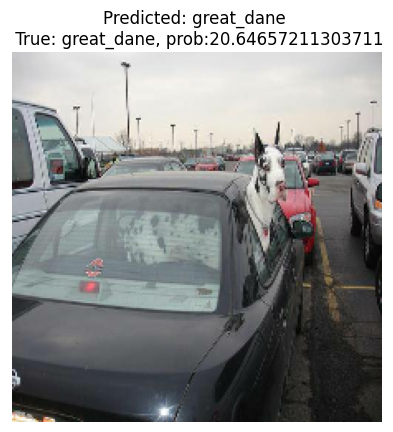

In [ ]:
def plot_prediction(prediction_prob,true_label,image,n):
  prediction_prob_n=prediction_prob[n]
  true_label_n=true_label[n]
  image_n=image[n]

  predicted_label=get_label(prediction_prob_n)
  plt.imshow(image_n)
  plt.title(f"Predicted: {predicted_label} \n True: {true_label_n}, prob:{np.max(prediction_prob_n)*100}")
  plt.axis("off")
plot_prediction(prediction_prob=predictions,true_label=validation_labels,image=validation_images,n=20)

In [ ]:
def plot_pred_conf(predictions,labels,n):
  prediction_n=predictions[n]
  true_label_n=labels[n]
  pred_label_n=get_label(prediction_n)

  # the top 10 prediction probablities indexes
  top_10_prediction_indexes=prediction_n.argsort()[-10:][::-1]
  top_10_prediction_values=prediction_n[top_10_prediction_indexes]
  #labels
  top_10_labels=unique_labels[top_10_prediction_indexes]



  plots=plt.bar(range(10),top_10_prediction_values,color='grey',)
  plt.xticks(range(10),labels=top_10_labels,
                rotation='vertical')
  if np.isin(true_label_n,top_10_labels):
    plots[np.argmax(true_label_n==top_10_labels)].set_color('green')



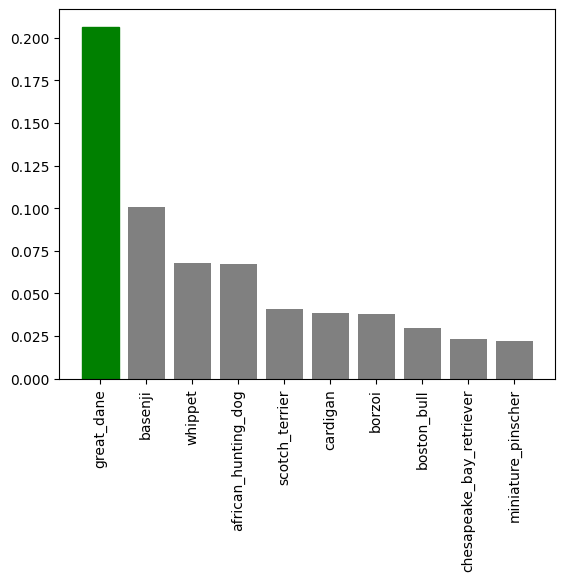

In [ ]:
plot_pred_conf(predictions,validation_labels,20)

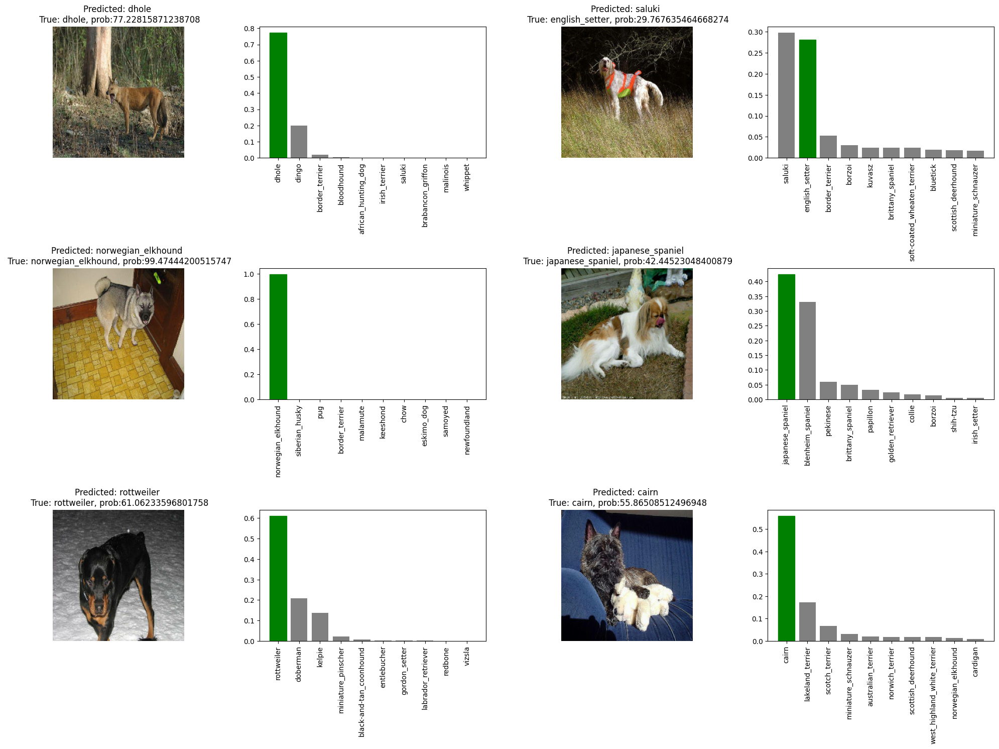

In [ ]:
i_multiplier = 2
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(6):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_prediction(prediction_prob=predictions,
            true_label=validation_labels,
            image=validation_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(predictions=predictions,
                 labels=validation_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [ ]:
def save_model(model,suffix=None):
  modelpath=os.path.join("drive/MyDrive/ML_Projects",datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  if suffix:
    modelpath=modelpath+"-"+suffix+".h5"
  model.save(modelpath)
  return modelpath

In [ ]:
def load_model(modelpath):
  model=tf.keras.models.load_model(modelpath)
  return model

In [ ]:
save_model(model,"1000-images")

'drive/MyDrive/ML_Projects/20241028-162054-1000-images.h5'

In [ ]:
load_model_=load_model('/content/drive/MyDrive/ML_Projects/dog-vision/20241028-162054-1000-images.h5')

In [ ]:
load_model_.evaluate(validation_data)


16/16 ━━━━━━━━━━━━━━━━━━━━ 9s 297ms/step - accuracy: 0.7384 - loss: 0.8992


[0.9702638983726501, 0.7120000123977661]

In [ ]:
model.evaluate(validation_data)

16/16 ━━━━━━━━━━━━━━━━━━━━ 5s 291ms/step - accuracy: 0.7384 - loss: 0.8992


[0.9702638983726501, 0.7120000123977661]

# Train on whole dataset

In [ ]:
full_model=create_model();
full_data=create_data_batches(X,Y)
full_model_callback=create_tensorboard_callback()
full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor="accuracy",patience=3)
full_model.fit(x=full_data,epochs=100,callbacks=[full_model_callback,full_model_early_stopping])

Building model with MobileNetV2 from Keras Applications
Epoch 1/100
150/150 ━━━━━━━━━━━━━━━━━━━━ 51s 285ms/step - accuracy: 0.2560 - loss: 3.5186
Epoch 2/100
150/150 ━━━━━━━━━━━━━━━━━━━━ 72s 237ms/step - accuracy: 0.7955 - loss: 0.8153
Epoch 3/100
150/150 ━━━━━━━━━━━━━━━━━━━━ 35s 236ms/step - accuracy: 0.8835 - loss: 0.4971
Epoch 4/100
150/150 ━━━━━━━━━━━━━━━━━━━━ 41s 237ms/step - accuracy: 0.9185 - loss: 0.3487
Epoch 5/100
150/150 ━━━━━━━━━━━━━━━━━━━━ 34s 229ms/step - accuracy: 0.9520 - loss: 0.2445
Epoch 6/100
150/150 ━━━━━━━━━━━━━━━━━━━━ 42s 235ms/step - accuracy: 0.9721 - loss: 0.1822
Epoch 7/100
150/150 ━━━━━━━━━━━━━━━━━━━━ 41s 235ms/step - accuracy: 0.9811 - loss: 0.1435
Epoch 8/100
150/150 ━━━━━━━━━━━━━━━━━━━━ 40s 228ms/step - accuracy: 0.9897 - loss: 0.1159
Epoch 9/100
150/150 ━━━━━━━━━━━━━━━━━━━━ 35s 233ms/step - accuracy: 0.9930 - loss: 0.0927
Epoch 10/100
150/150 ━━━━━━━━━━━━━━━━━━━━ 51s 337ms/step - accuracy: 0.9958 - loss: 0.0801
Epoch 11/100
150/150 ━━━━━━━━━━━━━━━━━━━━ 7

In [ ]:
save_model(full_model,"all-images")

'drive/MyDrive/ML_Projects/20241028-164830-all-images.h5'

In [ ]:
test_path=os.path.join('drive/MyDrive/ML_Projects/dog-vision/test/')
test_path=[test_path+fname for fname in os.listdir(test_path)]
test_data=create_data_batches(test_path,test_data=True)
test_predictions=full_model.predict(test_data, verbose=1)



324/324 ━━━━━━━━━━━━━━━━━━━━ 586s 2s/step
